# Classify architecture type from an image of a home

In [439]:
# Need to run `PYTORCH_ENABLE_MPS_FALLBACK=1 jupyter notebook` before loading this notebook
# there is an error that pops up later with augmentation that I couldn't figure out how to change while in the notebook.

# Suppress warnings from PyTorch
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

# fastai V1 library which sits on top of Pytorch 1.0
from fastai.vision import *

import requests

from bs4 import BeautifulSoup

from fastai.vision.all import *
from fastai.vision import *

# import my custom functions
from src.utils import _label_func

import pandas as pd
import matplotlib.pyplot as plt

import os
import sys

# add the 'src' directory as one where we can import modules
src_dir = os.path.join(os.getcwd(), 'src') #os.pardir, 'src')
sys.path.append(src_dir)

%load_ext autoreload
%autoreload 2

# Loading custom functions
from plot_map import find_unique, plot_arch_map, simpson_index, get_blocks, assign_block

import seaborn as sns

# Get color classes for plotting later
prediction_colors = {'bungalow': '#003f5c', 'victorian': '#7a5195', 'prairie': '#ef5675', 'foursquare': '#ffa600'}


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Look at results

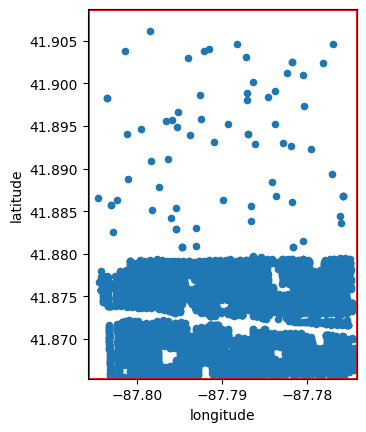

In [2]:
# now I need to find out how to extract data...
# soup.contents

# ok- thinking about this
# according to xx there are 25000 homes in Oak Park
# on redfin, there are ~3000 in last 5 years

# TODO make sure my scraping script is outputting home metadata correctly

# load redfin metadata
rf_metadata = pd.read_csv('data/interim/redfin_metadata.csv')

# Fill NaN values with a placeholder integer (e.g., -1)
rf_metadata['property_id'] = rf_metadata['property_id'].fillna(-1).astype(int)

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

# Plot the latitude and longitude of the homes
rf_metadata.plot(kind='scatter', x='longitude', y='latitude')

# Draw rectangle for Oak Park
plt.gca().add_patch(plt.Rectangle((uleft[1], lright[0]), lright[1] - uleft[1], uleft[0] - lright[0], 
                                  edgecolor='r', facecolor='none', lw=2))

plt.xlim(min(rf_metadata['longitude'].min(), uleft[1]), max(rf_metadata['longitude'].max(), lright[1]))
plt.ylim(min(rf_metadata['latitude'].min(), lright[0]), max(rf_metadata['latitude'].max(), uleft[0]))

plt.gca().set_aspect('equal', adjustable='box')

## additional metadata

In [16]:
rf_metadata.reset_index(drop=True, inplace=True)
rf_metadata

,input,match,property_id,latitude,longitude,search_url,image_url,home_value,in_oak_park
0,726 S GROVE AVE,726 S Grove Ave,13248762,41.875137,-87.795036,/IL/Oak-Park/726-S-Grove-Ave-60304/home/13248762,['https://ssl.cdn-redfin.com/photo/68/mbphoto/658/genMid.08644658_2.jpg'],585000.0,1
1,728 S HUMPHREY AV,728 S Humphrey Ave,13250847,41.875318,-87.775440,/IL/Oak-Park/728-S-Humphrey-Ave-60304/home/13250847,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=728+S+Humphrey+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=BacE2Md19gNSbjVgn9qGEQoBBoM='],NaN,1
2,612 S OAK PK AVE,612 S Kenilworth Ave,13249915,41.877796,-87.796993,/IL/Oak-Park/612-S-Kenilworth-Ave-60304/home/13249915,['https://ssl.cdn-redfin.com/photo/68/mbphoto/817/genMid.09704817_2.jpg'],579000.0,1
3,1040 S TAYLOR,1040 S Taylor Ave,13251489,41.869238,-87.777672,/IL/Oak-Park/1040-S-Taylor-Ave-60304/home/13251489,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=1040+S+Taylor+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=EsgGLnDUgxGOMIKHaSt8-Q-iwTw='],NaN,1
4,847 S HUMPHREY #1,847 S Humphrey Ave #1,12659015,41.872904,-87.775986,/IL/Oak-Park/847-S-Humphrey-Ave-60304/unit-1/home/12659015,['https://ssl.cdn-redfin.com/photo/68/mbphoto/634/genMid.10858634_0.jpg'],165000.0,1
...,...,...,...,...,...,...,...,...,...
4360,940 WESLEY AVE,940 Wesley Ave,13247930,41.871097,-87.791192,/IL/Oak-Park/940-Wesley-Ave-60304/home/13247930,['https://ssl.cdn-redfin.com/photo/68/mbphoto/562/genMid.10641562_0.jpg'],415000.0,1
4361,605 S CLARENCE,605 Clarence Ave,13250259,41.877701,-87.790835,/IL/Oak-Park/605-Clarence-Ave-60304/home/13250259,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=605+Clarence+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=QY_e3dCKplc4GUFVdimjpvNciqo='],515000.0,1
4362,1136 SO HUMPHREY,1136 S Humphrey Ave,13251481,41.867717,-87.775199,/IL/Oak-Park/1136-S-Humphrey-Ave-60304/home/13251481,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=1136+S+Humphrey+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=8HEIvy0e7evRbEycJRa0EGuEFIY='],NaN,1
4363,602 S CUYLER AV,602 S Cuyler Ave,13252458,41.877890,-87.782912,/IL/Oak-Park/602-S-Cuyler-Ave-60304/home/13252458,['https://ssl.cdn-redfin.com/photo/68/mbphoto/131/genMid.11741131_0.jpg'],85500.0,1


In [25]:
# Function to get info from redfin

def get_year(url, pid):
    import requests
    import json
    import re
    page = requests.get('https://www.redfin.com/stingray/api/home/details/mainHouseInfoPanelInfo?propertyId=' + str(pid) + '&accessLevel=3&path=' + url, headers={'user-agent': 'redfin'})
    info = json.loads(page.text[4:])
    content = info['payload']['mainHouseInfo']['selectedAmenities'][1]['content']
    home_type = info['payload']['mainHouseInfo']['selectedAmenities'][3]['content']
    year_built = re.findall('Built in (\\d+)', content)[0]
    return home_type, year_built

# Testing zone
url='/IL/Oak-Park/1019-Highland-Ave-60304/home/13251221'
pid=13251221
# page = requests.get('https://www.redfin.com/stingray/api/home/details/mainHouseInfoPanelInfo?propertyId=' + str(pid) + '&accessLevel=3&path=' + url, headers={'user-agent': 'redfin'})
# info = json.loads(page.text[4:])
get_year(url, pid)


('Single-family', '1914')

In [47]:
from tqdm.notebook import tqdm
from time import sleep

# UNCOMMENT TO RUN!
# TODO put this in the scrape.py script

# Add home type and year built to dataframe
# for i in tqdm(range(len(rf_metadata))):
#     try:
#         rf_metadata.loc[i, ['home_type', 'year_built']] = get_year(rf_metadata['search_url'][i], rf_metadata['property_id'][i])
#     except:
#         pass


  0%|          | 0/4365 [00:00<?, ?it/s]

In [52]:
# Save intermediate
rf_metadata.to_csv('data/interim/redfin_metadata_year.csv', index=False)


In [54]:
# rf_metadata.head()

# rf_metadata['home_type'].value_counts()

rf_metadata = rf_metadata[rf_metadata['home_type'] == 'Single-family']

rf_metadata['home_type'].value_counts()




home_type
Single-family    3641
Name: count, dtype: int64

## House image classifier

### Image loading setup

In [55]:
# get images for training the model
path = "/Users/chad/github/architecture/images/training"
fnames = get_image_files(path)

len(fnames) # 109 images


109

### Use image augmentation to increase training samples

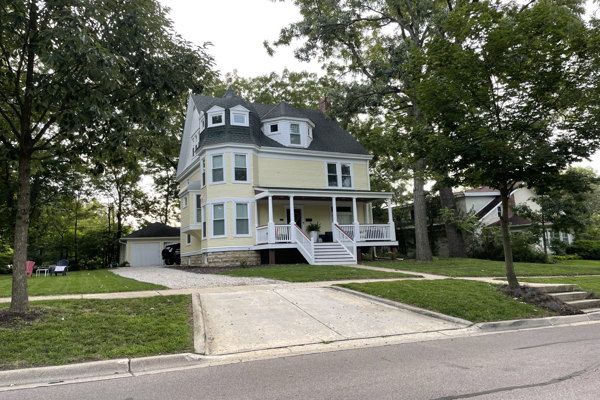

In [56]:
# single image of a house
img = PILImage(PILImage.create(fnames[0]).resize((600,400)))
img

In [58]:
# Setup augmentation transforms of image
# NB: I took these parameters from an existing project on github-
# https://github.com/dumitrux/architectural-style-recognition/blob/master/src/architectural-style-recognition.ipynb
# The get_transforms function is for the old fastai/pytorch versions so now we need to use aug_transforms

tfms = aug_transforms(pad_mode='zeros', mult=2, min_scale=0.75, do_flip=True, flip_vert=False, max_rotate=3, max_zoom=1.1,
                     max_lighting=0.2, max_warp=0.1, p_affine=0.75, p_lighting=0.5)


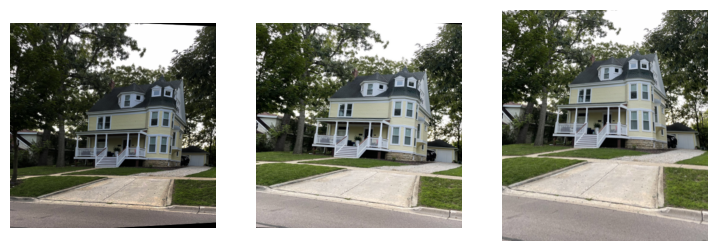

In [59]:
# Visualize the image transformations

from fastai.vision.all import TensorImage

timg = TensorImage(array(img)).permute(2,0,1).float()/255.

def _batch_ex(bs):
    return TensorImage(timg[None].expand(bs, *timg.shape).clone())

# plot some sample transformations
y = _batch_ex(9)
for t in tfms: y = t(y, split_idx=0)
_,axs = plt.subplots(1,3, figsize=(9,3))
for i,ax in enumerate(axs.flatten()): show_image(y[i], ctx=ax)

# save this image to a file
plt.axis('tight')
plt.savefig('reports/figures/warp.jpg')


In [60]:
# this way was using cap letter as labeler
# dls = ImageDataLoaders.from_name_func(path, files, label_func, bs=5, item_tfms=Resize(224), valid_pct=0.2)
# valid_pct is the percent of images used for validation

# this pulls the label from the file name (stuff before _ or -)
# dls = ImageDataLoaders.from_name_re(path, files, pat='^(.*)[_-].*?.jpg', item_tfms=Resize(224), bs=5)

# trying datablock instead
# here the subfolder name is used as the label
dblock = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(valid_pct=0.2, seed=44),
                   item_tfms = Resize(224),
                   batch_tfms = tfms)

# does this help anything?
# batch_tfms = aug_transforms(size=224)
# load the data (batch size 5 minimum)
dls = dblock.dataloaders(path, bs=12)

NB: this spits out a pytorch warning, but it seems to work still

In [61]:
# show the data
'train:', len(dls.train.items), 'valid:', len(dls.valid.items)

('train:', 88, 'valid:', 21)

In [62]:
print("Training images:\n", [x.stem for x in dls.train.items], "\n")
print("Validation images:\n", [x.stem for x in dls.valid.items])

Training images:
 ['chicagobungalow4', 'The-Thomas-Wells-House', 'chicagobungalow3', '2449FourSquare', 'YellowFourSquare', '4703-Highland-Ave', 'The-Campbell-House', 'The-Joseph-Moore-House-e1694963944109', 'shutterstock_1263296944', 'forest-ave-4815', '21635476-1', 'main3', 'red-victorian-home-wrap-around-porch-964fcce8-6d2ab8ee6f5b4d79941bd8866d1fb9ec', '5217-Fairmount-Ave-From-Google', 'The-Mitchell-Heintz-House', 'The-Gerardus-J.-Verbeck-House', 'The-Hanson-House', 'The-A.C.-Riddler-House', 'The-Darnley-House', 'CH32FEAWIL_LuxeDryED_0110-fit=constrain&wid=2560&hei=1440', 'portland-foursquare-home', 'GettyImages-165432736-scaled', 'The-Ella-Beaudette-House-gray', 'abf48490bbdb4d68efe381f71b11336b', 'chicagobungalow5', 'Maple-Ave-1323-2', 'The-Reideler-House', '701-maple-ave-herring-house', '710-maple-ave-cole-house', 'framebungalow', 'chicagobungalow8', 'XL_11792_bigrock_winter07', 'what-is-a-bungalow', 'prairie_751ClintonPl', 'IMG_4992-scaled', 'victorian-home_window-world-hero_198

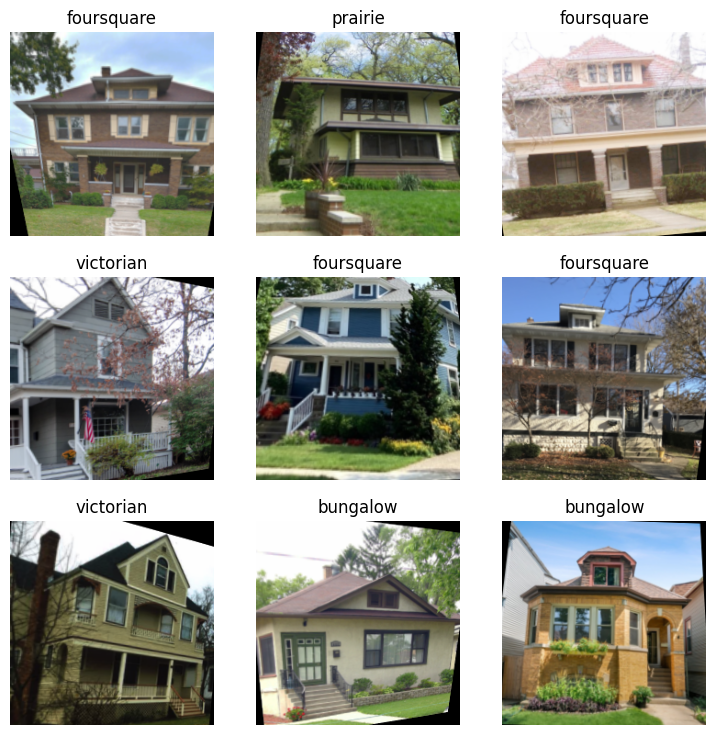

In [63]:
dls.show_batch()

In [64]:
# train the model
learn = vision_learner(dls, resnet34, metrics=error_rate)
# NB this was using ~6 cores on my local machine (macbook)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=de

SuggestedLRs(valley=0.001737800776027143)

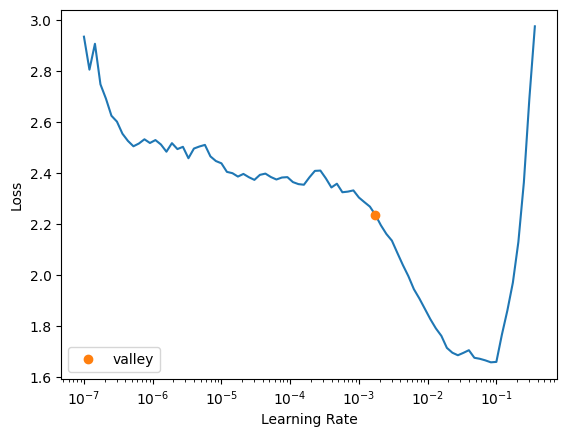

In [65]:
# ?? find optimal parameters for fine-tuning the model
# Find optimal learning rate
learn.lr_find()

In [67]:
# fine tune the learner
learn.fine_tune(10, 0.0017)

epoch,train_loss,valid_loss,error_rate,time
0,0.341186,0.445317,0.190476,00:05


epoch,train_loss,valid_loss,error_rate,time
0,0.153689,0.431634,0.190476,00:05
1,0.294418,0.299721,0.142857,00:05
2,0.258201,0.352263,0.095238,00:05
3,0.261274,0.494770,0.190476,00:05
4,0.254172,0.462877,0.190476,00:05
5,0.294119,0.559787,0.190476,00:05
6,0.280162,0.627488,0.285714,00:05
7,0.292837,0.629318,0.238095,00:05
8,0.265163,0.606661,0.190476,00:05
9,0.235530,0.613053,0.190476,00:05


Getting pretty decent performance (>80% accuracy) with only this 110+ image set

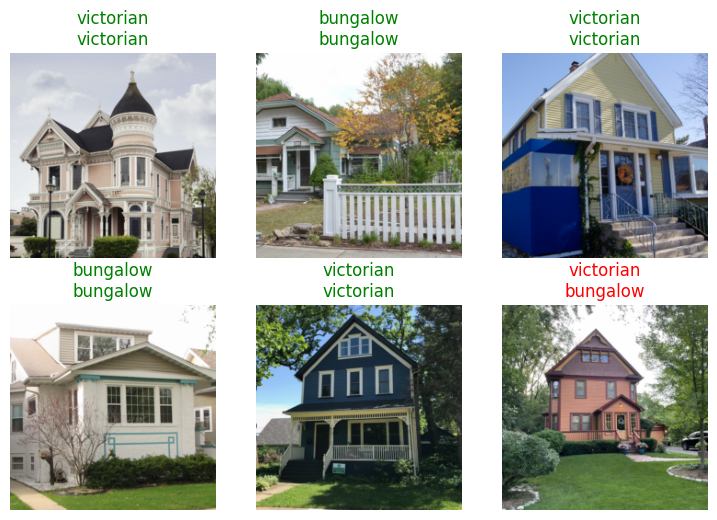

In [68]:
learn.show_results(max_n=6)
plt.savefig('reports/figures/learn_results.png')

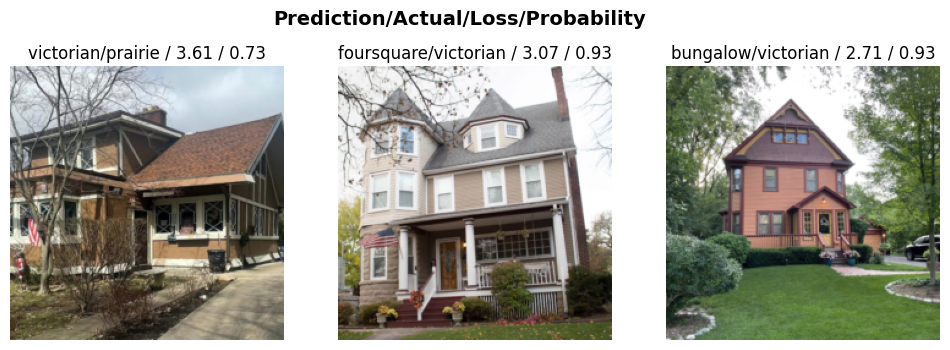

In [69]:
# find the images that give the most problems
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(3, figsize=(12,4))

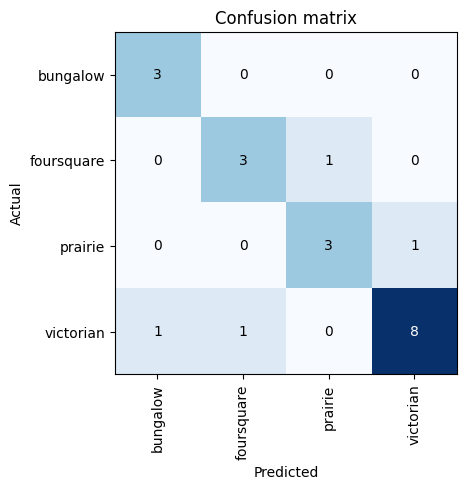

In [70]:
# look at confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
plt.savefig('reports/figures/confusion_matrix.png')

From this, we can see that bungalows, foursquares, and prairie-style homes all kind of blend together.

### Save and reload the final model

In [45]:
# learn.save('architecture_model')
# learn.load('architecture_model')

Path('models/architecture_model.pth')

## Predicting home types

### Using the trained model to predict house type from Redfin images

In [71]:
import os
import pandas as pd
from tqdm.notebook import tqdm

# Get list of file paths to the test images
test_images = get_image_files('images/testing')

df_preds = pd.DataFrame(columns=['image', 'prediction', 'probability'])

# Load and predict on each test image
for i in tqdm(range(len(test_images))):
    img_path = test_images[i]
    img = PILImage.create(img_path)
    pred, _, probs = learn.predict(img)
    # Get the basename of the first test image path
    nm = os.path.basename(img_path)
    # Selecting top prediction based on max probability (e.g., `.max().item()`)
    df = pd.DataFrame({'image': nm, 'prediction': pred, 'probability': probs.max().item()}, index=[0])
    df_preds = pd.concat([df_preds, df])

# Get the property ID from the image name
df_preds['pid'] = df_preds['image'].str.extract(r'pid(\d+)', expand=False)

# Convert property ID to integer
df_preds['pid'] = df_preds['pid'].astype(int)


  0%|          | 0/4297 [00:00<?, ?it/s]

array([[<Axes: title={'center': 'probability'}>]], dtype=object)

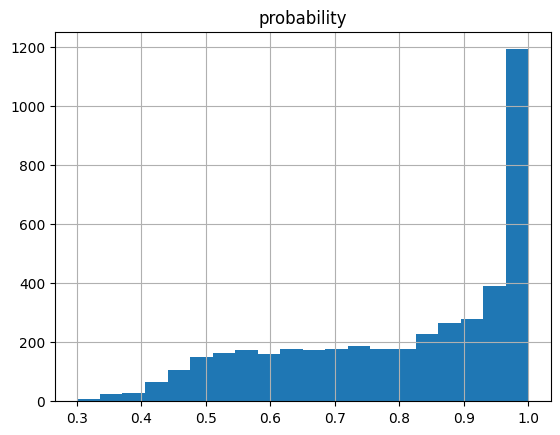

In [72]:
# Look at the distribution of probabilities across all predictions
df_preds.hist(column='probability', bins=20)

# df_preds.boxplot(column='probability', by='prediction')


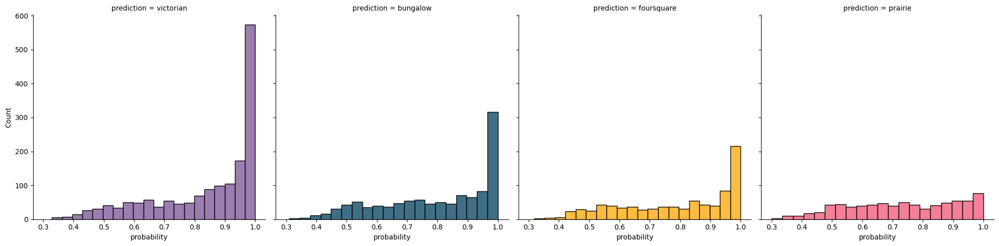

In [73]:
# Look at probabilities for home styles individually
g = sns.FacetGrid(data=df_preds, col='prediction', col_wrap=4, height=5, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'probability', bins=20, kde=False)
plt.savefig('reports/figures/probability_hist.png')

### Create map of architectural diversity by block

In [74]:
import seaborn as sns

# TODO plot a heatmap of the architectural diveristy by neighborhood

# Extract the relevant part of the image name using regex
# df_preds['extracted'] = df_preds['image'].str.extract(r'(\d+-\w+-\w+-\w+)', expand=False)
# df_preds['extracted'].values[0]

df_merged = df_preds.merge(rf_metadata, left_on='pid', right_on='property_id')

df_merged.to_csv('data/processed/rf_predictions.csv', index=False)

# TODO calculate architecture diversity by neighborhood

# Plot scatter of latitude and longitude with color as prediction
# sns.scatterplot(data=df_merged, x='longitude', y='latitude', hue='prediction')

In [75]:
df_merged.head()

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,image_url,home_value,in_oak_park,home_type,year_built
0,1019-Highland-Ave_pid13251221.jpg,victorian,0.951998,13251221,1019 HIGHLAND AV,1019 Highland Ave,13251221,41.870135,-87.781963,/IL/Oak-Park/1019-Highland-Ave-60304/home/13251221,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=41.8701352%2C-87.7819634&size=665x441&source=outdoor&client=gme-redfin&signature=MMKpPFjZOzY8V3__v1sw28LAzik='],350000.0,1,Single-family,1914
1,1040-S-Taylor-Ave_pid13251489.jpg,bungalow,0.777764,13251489,1040 S TAYLOR,1040 S Taylor Ave,13251489,41.869238,-87.777672,/IL/Oak-Park/1040-S-Taylor-Ave-60304/home/13251489,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=1040+S+Taylor+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=EsgGLnDUgxGOMIKHaSt8-Q-iwTw='],NaN,1,Single-family,1905
2,1167-S-Taylor-Ave_pid13251174.jpg,bungalow,0.970015,13251174,1167 S TAYLOR AVE,1167 S Taylor Ave,13251174,41.866586,-87.778146,/IL/Oak-Park/1167-S-Taylor-Ave-60304/home/13251174,['https://ssl.cdn-redfin.com/photo/68/mbphoto/648/genMid.12154648_0.jpg'],NaN,1,Single-family,1894
3,610-Clarence-Ave_pid13248712.jpg,victorian,0.868146,13248712,610 CLARENCE AV,610 Clarence Ave,13248712,41.877530,-87.790208,/IL/Oak-Park/610-Clarence-Ave-60304/home/13248712,['https://maps.googleapis.com/maps/api/streetview?channel=mb-pdp-publicrecord&location=610+Clarence+Ave%2C+Oak+Park%2C+IL+60304&size=665x441&source=outdoor&client=gme-redfin&signature=NxxgPumy5q7G2nYmoO72Tju_uIM='],339000.0,1,Single-family,1918
4,732-S-Taylor-Ave_pid13252072.jpg,bungalow,0.975936,13252072,732 S TAYLOR AVE,732 S Taylor Ave,13252072,41.875122,-87.777870,/IL/Oak-Park/732-S-Taylor-Ave-60304/home/13252072,['https://ssl.cdn-redfin.com/photo/68/mbphoto/787/genMid.11784787_0.jpg'],760000.0,1,Single-family,1918


<Axes: >

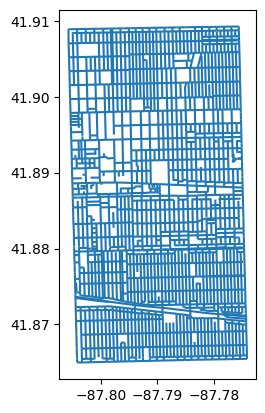

In [287]:
# Load roads database

import geopandas as gpd

# Import all roads NL
map_df = gpd.read_file('data/raw/roads/Street_Centerlines.shp')

# Convert from meters to lat/long
map_df = map_df.to_crs(epsg=4326)
map_df.plot()

In [77]:
# Look at counts of predictions
# Most common is victorian- does that make sense?
df_merged['prediction'].value_counts()

prediction
victorian     1365
bungalow       985
foursquare     722
prairie        569
Name: count, dtype: int64

### Mapping "alpha" diversity of architectural styles
In this section, we will create a heatmap plot to visualize the density of different architectural styles in Oak Park, IL. This type of plot helps in understanding the spatial distribution and density of various house types in the area. Note: I am using the concept of alpha diversity borrowed from the field of ecology. The idea is that in a given 30m radius, diversity is the number of unique home styles in that area.

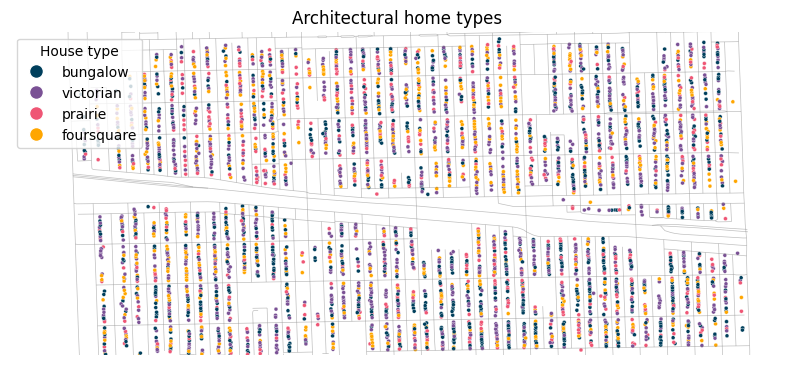

In [79]:
# Create unique home in radius column
df_merged['unique_homes_in_radius'] = find_unique(df_merged, radius=0.0002)  # .0001 is about 10 meters

# Plot only home types
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural home types',
              file_name='reports/figures/arch_div_p00_r20_noHM.png',
              heatmap=False, road_col='gray')


<Axes: xlabel='lonbin_mid', ylabel='latbin_mid'>

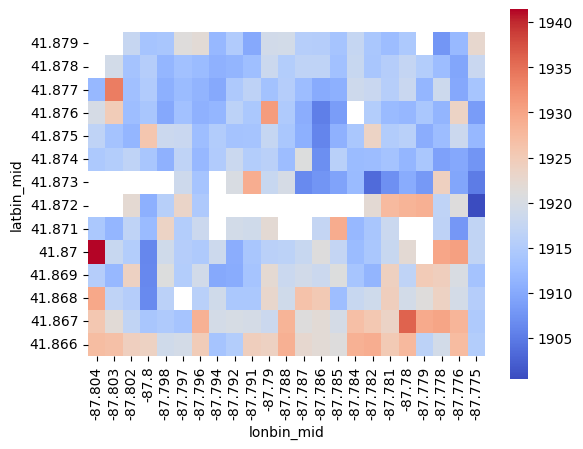

In [322]:

# gdf = gpd.GeoDataFrame(df_merged, geometry=gpd.points_from_xy(df_merged.longitude, df_merged.latitude))
# help(gdf.resample)

# gdf.buf = gdf.buffer(0.0005)

# gdf.buf

df = df_merged.copy()

df = df[df['latitude'] < 41.88]

RESO = 25

import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1)

df['latbin'] = pd.cut(df['latitude'], bins=RESO)
df['lonbin'] = pd.cut(df['longitude'], bins=RESO)
df['latbin_mid'] = round(df['latbin'].apply(lambda x: x.mid).astype(float), 3)
df['lonbin_mid'] = round(df['lonbin'].apply(lambda x: x.mid).astype(float), 3)

df2 = df.groupby(['latbin_mid', 'lonbin_mid'])['year_built'].mean().unstack()
df2.sort_index(ascending=False, inplace=True)

sns.heatmap(df2, cmap='coolwarm', annot=False, ax=ax)

map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

# Overlay the heatmap with the architectural diversity map
# sns.scatterplot(data=df2_long, x='lonbin_mid', y='latbin_mid', hue='year_built', palette='coolwarm', ax=ax, legend=False, s=50, edgecolor='white')

# ax.set_ylim(41.86, 41.885)

# plt.set_xlim(df['longitude'].min(), df['longitude'].max())
# plt.set_ylim(df['latitude'].min(), df['latitude'].max())




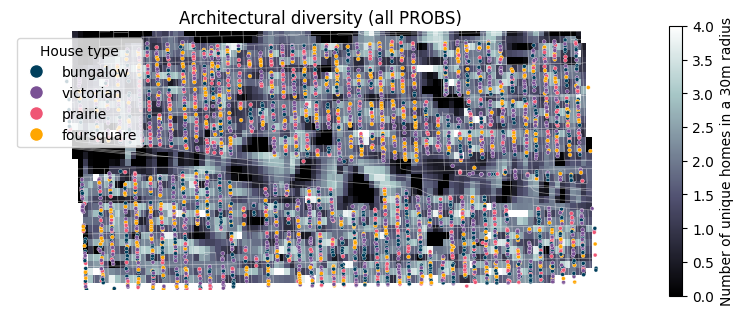

In [80]:
# Add in diversity layer
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural diversity (all PROBS)', file_name='reports/figures/arch_div_p00_r20.png', cmap='bone')


/Users/chad/github/architecture/env/lib/python3.10/site-packages/momepy/utils.py:352: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


,geometry,size
0,"POLYGON ((-87.80240 41.89974, -87.80241 41.89988, -87.80242 41.90041, -87.80245 41.90129, -87.80246 41.90157, -87.80220 41.90157, -87.80137 41.90159, -87.80094 41.90159, -87.80092 41.90102, -87.80091 41.90046, -87.80090 41.90011, -87.80089 41.89977, -87.80128 41.89976, -87.80215 41.89975, -87.80240 41.89974))",0.000003
1,"POLYGON ((-87.80246 41.90157, -87.80245 41.90129, -87.80242 41.90041, -87.80241 41.89988, -87.80240 41.89974, -87.80282 41.89974, -87.80347 41.89973, -87.80392 41.89972, -87.80393 41.89999, -87.80396 41.90067, -87.80398 41.90142, -87.80398 41.90154, -87.80371 41.90155, -87.80295 41.90156, -87.80246 41.90157))",0.000003
2,"POLYGON ((-87.80392 41.89972, -87.80347 41.89973, -87.80282 41.89974, -87.80240 41.89974, -87.80239 41.89944, -87.80237 41.89859, -87.80236 41.89839, -87.80234 41.89792, -87.80258 41.89791, -87.80304 41.89791, -87.80337 41.89790, -87.80363 41.89789, -87.80386 41.89789, -87.80390 41.89904, -87.80392 41.89959, -87.80392 41.89972))",0.000003
3,"POLYGON ((-87.80240 41.89974, -87.80215 41.89975, -87.80128 41.89976, -87.80089 41.89977, -87.80088 41.89952, -87.80086 41.89890, -87.80084 41.89842, -87.80159 41.89840, -87.80236 41.89839, -87.80237 41.89859, -87.80239 41.89944, -87.80240 41.89974))",0.000002
4,"POLYGON ((-87.80246 41.90157, -87.80247 41.90179, -87.80249 41.90235, -87.80251 41.90299, -87.80253 41.90341, -87.80216 41.90341, -87.80176 41.90342, -87.80128 41.90343, -87.80100 41.90343, -87.80100 41.90327, -87.80097 41.90240, -87.80095 41.90179, -87.80094 41.90159, -87.80137 41.90159, -87.80220 41.90157, -87.80246 41.90157))",0.000003


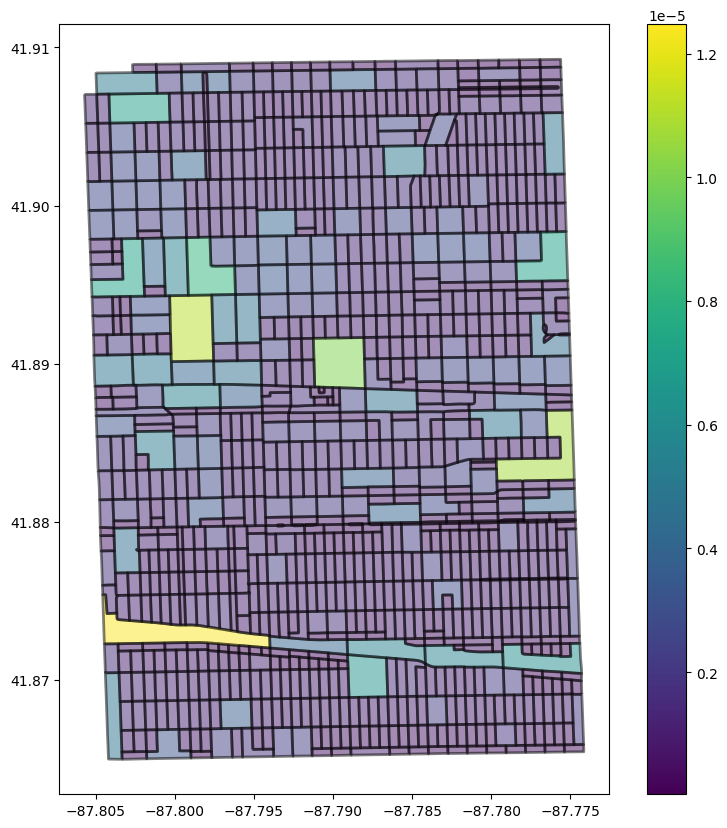

In [492]:
# Import roads shape files as a GeoDataFrame
blocks = get_blocks(shapefile = 'data/raw/roads/Street_Centerlines.shp', plot=True)
blocks.head()

<Axes: xlabel='simpson', ylabel='Count'>

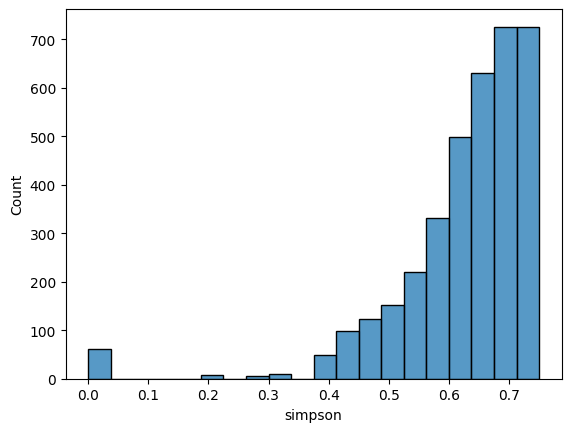

In [587]:
# Assign each house to a block
df_merged['block'] = df_merged.apply(lambda x: assign_block((x['longitude'], x['latitude']), blocks), axis=1)


# Calculate the Simpson index for each block
df_merged['simpson'] = df_merged['prediction'].groupby(df_merged['block']).transform(simpson_index)

# df_merged[df_merged['match'].str.contains('613')]
# print(df_merged[df_merged['block'] == 203].head)

# Histogram of the Simpson index
sns.histplot(df_merged['simpson'], bins=20)


<Axes: xlabel='longitude', ylabel='latitude'>

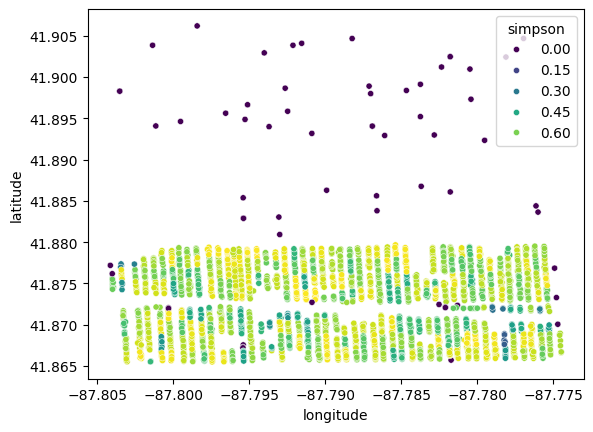

In [588]:
# Plot the blocks with colors corresponding to the Simpson index
sns.scatterplot(data=df_merged, x='longitude', y='latitude', hue='simpson', palette='viridis', s=20)


,simpson,home_value,year_built,latitude,longitude
simpson,1.000000,-0.050607,-0.014139,-0.251385,-0.026069
home_value,-0.050607,1.000000,0.018597,0.155707,-0.167369
year_built,-0.014139,0.018597,1.000000,-0.132464,0.018591
latitude,-0.251385,0.155707,-0.132464,1.000000,0.012275
longitude,-0.026069,-0.167369,0.018591,0.012275,1.000000


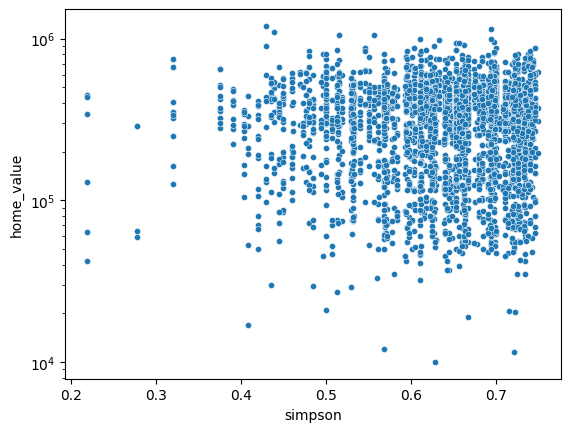

In [597]:
# Plot home values and Simpson index
g = sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='home_value', s=20)
g.set_yscale('log')

# Is this relationship significant?

# Calculate the correlation between the Simpson index and home value
df_merged[['simpson', 'home_value', 'year_built', 'latitude', 'longitude']].corr()

# sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='latitude', s=20)

# Prob not, but the correlation matrix shows that latitude and simpson index are strongly correlated (-0.25)


<Axes: xlabel='year_built', ylabel='simpson'>

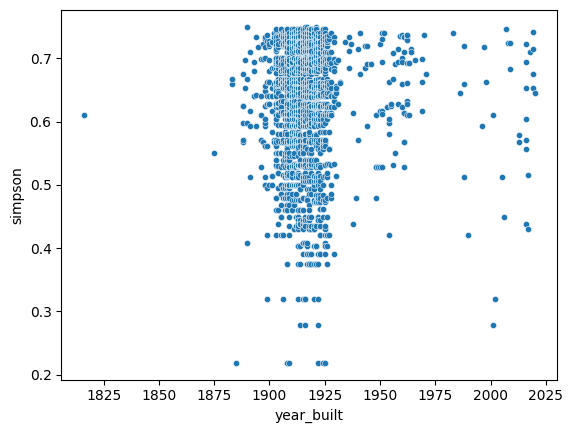

In [590]:
# Plot the Simpson index against the year built
sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)],
                x='year_built', y='simpson', s=20)

(41.8654982, 41.88)

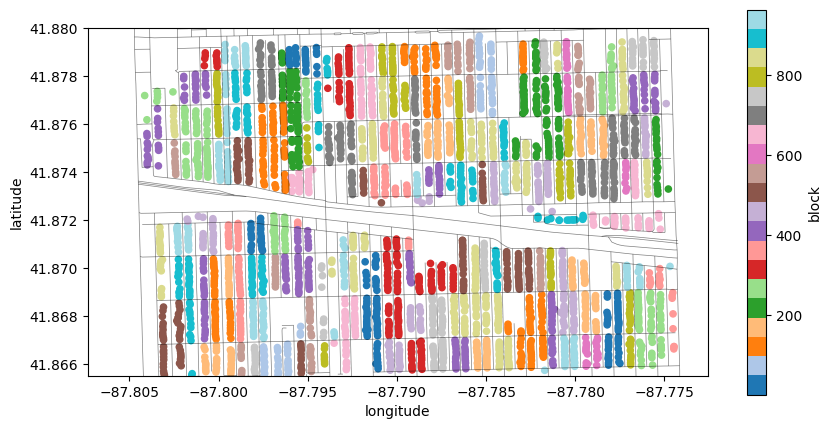

In [456]:
# Plot the blocks with colors corresponding to the block each house is in
fig, ax = plt.subplots(figsize=(10, 5))

df_merged.plot('longitude', 'latitude', kind='scatter', c='block', cmap='tab20', ax=ax)

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)


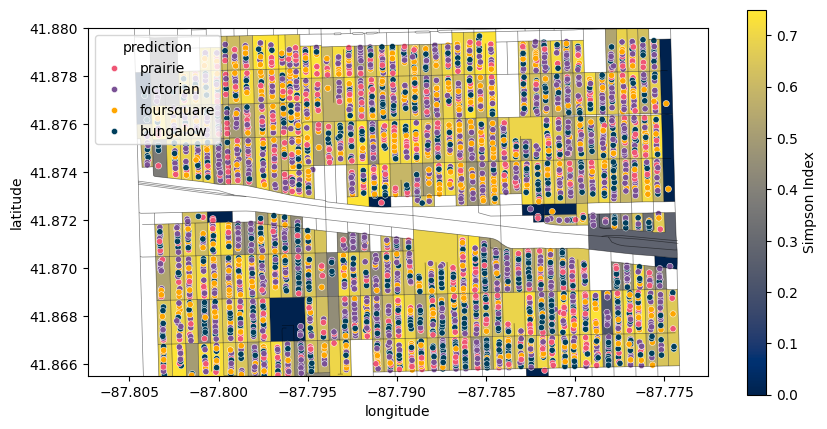

In [586]:
blocks.index.name = 'blockID'

simp_ind = df_merged.groupby('block')['simpson'].mean()

blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]

fig, ax = plt.subplots(figsize=(10, 5))

blocks2.plot(column='simpson', ax=ax, cmap='cividis')

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)

sns.scatterplot(df_merged, x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)

# Add color scale bar
sm = plt.cm.ScalarMappable(cmap='cividis', norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')

ax.set_axis_off()

# Save the figure
plt.savefig('reports/figures/simpson_index.png')

In [577]:
PROB_CUTOFF = 0.8
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)

# simp_ind = simp_ind.reset_index().rename(columns={0: 'prediction'})

# simp_ind, simp_ind[961]



,geometry,size
blockID,,
0,"POLYGON ((-87.80240 41.89974, -87.80241 41.89988, -87.80242 41.90041, -87.80245 41.90129, -87.80246 41.90157, -87.80220 41.90157, -87.80137 41.90159, -87.80094 41.90159, -87.80092 41.90102, -87.80091 41.90046, -87.80090 41.90011, -87.80089 41.89977, -87.80128 41.89976, -87.80215 41.89975, -87.80240 41.89974))",2.773424e-06
1,"POLYGON ((-87.80246 41.90157, -87.80245 41.90129, -87.80242 41.90041, -87.80241 41.89988, -87.80240 41.89974, -87.80282 41.89974, -87.80347 41.89973, -87.80392 41.89972, -87.80393 41.89999, -87.80396 41.90067, -87.80398 41.90142, -87.80398 41.90154, -87.80371 41.90155, -87.80295 41.90156, -87.80246 41.90157))",2.774285e-06
2,"POLYGON ((-87.80392 41.89972, -87.80347 41.89973, -87.80282 41.89974, -87.80240 41.89974, -87.80239 41.89944, -87.80237 41.89859, -87.80236 41.89839, -87.80234 41.89792, -87.80258 41.89791, -87.80304 41.89791, -87.80337 41.89790, -87.80363 41.89789, -87.80386 41.89789, -87.80390 41.89904, -87.80392 41.89959, -87.80392 41.89972))",2.772963e-06
3,"POLYGON ((-87.80240 41.89974, -87.80215 41.89975, -87.80128 41.89976, -87.80089 41.89977, -87.80088 41.89952, -87.80086 41.89890, -87.80084 41.89842, -87.80159 41.89840, -87.80236 41.89839, -87.80237 41.89859, -87.80239 41.89944, -87.80240 41.89974))",2.052528e-06
4,"POLYGON ((-87.80246 41.90157, -87.80247 41.90179, -87.80249 41.90235, -87.80251 41.90299, -87.80253 41.90341, -87.80216 41.90341, -87.80176 41.90342, -87.80128 41.90343, -87.80100 41.90343, -87.80100 41.90327, -87.80097 41.90240, -87.80095 41.90179, -87.80094 41.90159, -87.80137 41.90159, -87.80220 41.90157, -87.80246 41.90157))",2.797596e-06
...,...,...
974,"POLYGON ((-87.77472 41.88210, -87.77500 41.88210, -87.77581 41.88209, -87.77635 41.88208, -87.77636 41.88262, -87.77628 41.88262, -87.77588 41.88263, -87.77556 41.88263, -87.77550 41.88263, -87.77502 41.88264, -87.77489 41.88264, -87.77474 41.88265, -87.77472 41.88210))",8.830332e-07
975,"POLYGON ((-87.78899 41.87985, -87.78891 41.87988, -87.78821 41.87989, -87.78813 41.87986, -87.78818 41.87982, -87.78891 41.87981, -87.78899 41.87985, -87.78899 41.87985))",5.969662e-08
976,"POLYGON ((-87.79187 41.87980, -87.79190 41.87976, -87.79245 41.87975, -87.79248 41.87979, -87.79248 41.87981, -87.79193 41.87982, -87.79187 41.87980))",3.904977e-08


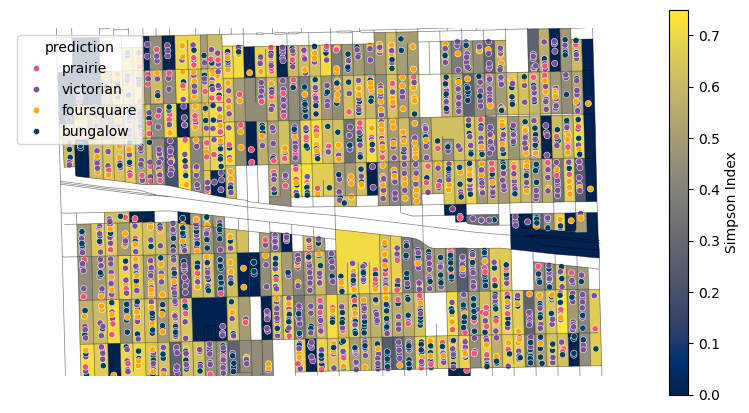

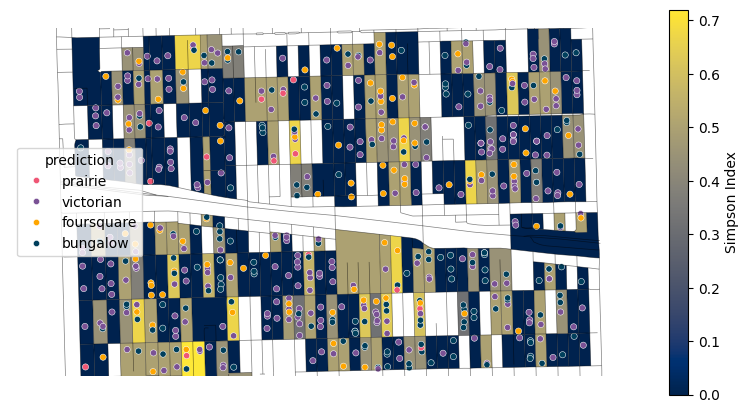

In [583]:
blocks.index.name = 'blockID'

PALETTE = 'cividis'

# Plot blocks with medium-high probability (>80%)
PROB_CUTOFF = 0.8
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')


# Plot blocks with very-high probability (>80%)
PROB_CUTOFF = 0.99
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')



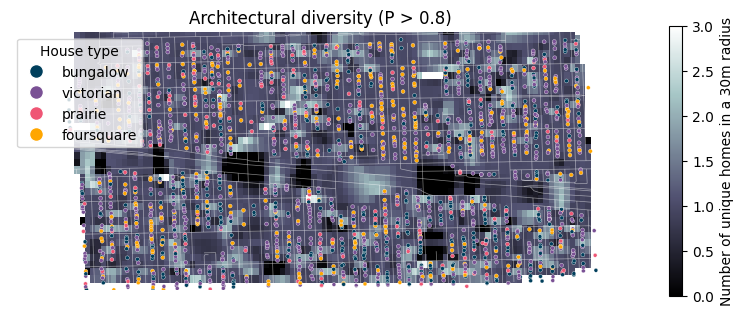

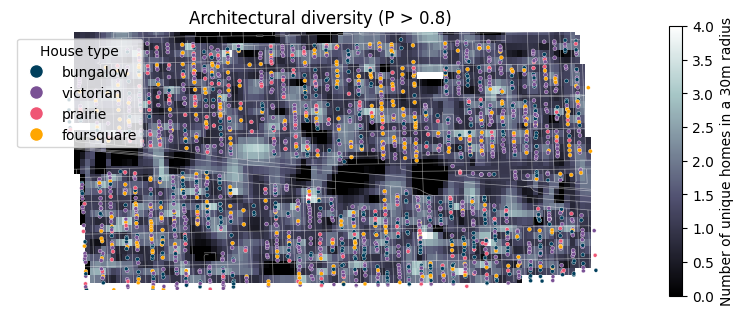

In [81]:
# Create a new column for number of unique homes in a given radius
df_merged['unique_homes_in_radius'] = float('nan')

# Subset the data frame to include only high confidence predictions
idx = df_merged['probability'] > 0.8
plot_df = df_merged[idx]

# Plot with 10m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0001)  # .0001 is about 10 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r10.png')

# Plot with 20m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0002)  # .0002 is about 20 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r20.png')


<Axes: xlabel='prediction', ylabel='home_value'>

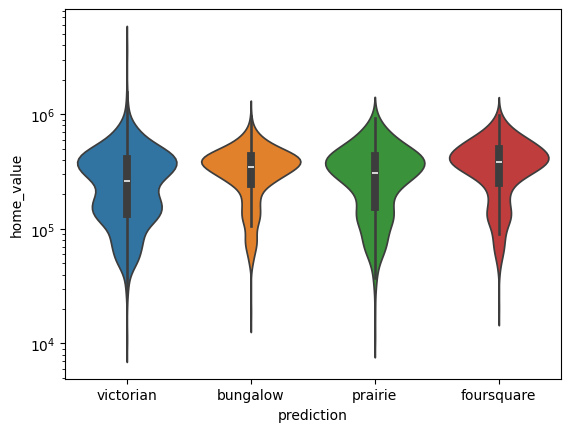

In [82]:
sns.violinplot(data=df_merged, x='prediction', y='home_value', hue='prediction', legend=False, log_scale=True)

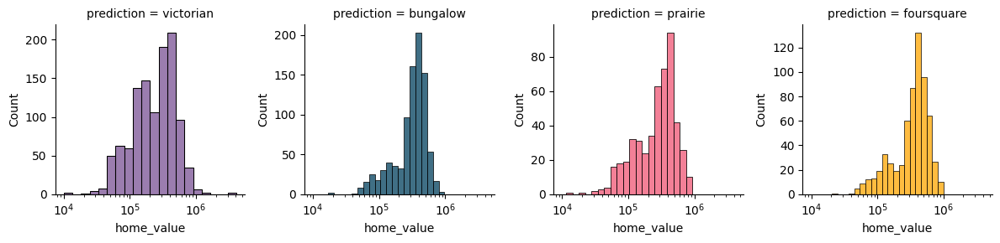

In [83]:
# Plot histograms of home values for each prediction
g = sns.FacetGrid(df_merged, col='prediction', col_wrap=4, sharey=False, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'home_value', bins=20, log_scale=True)

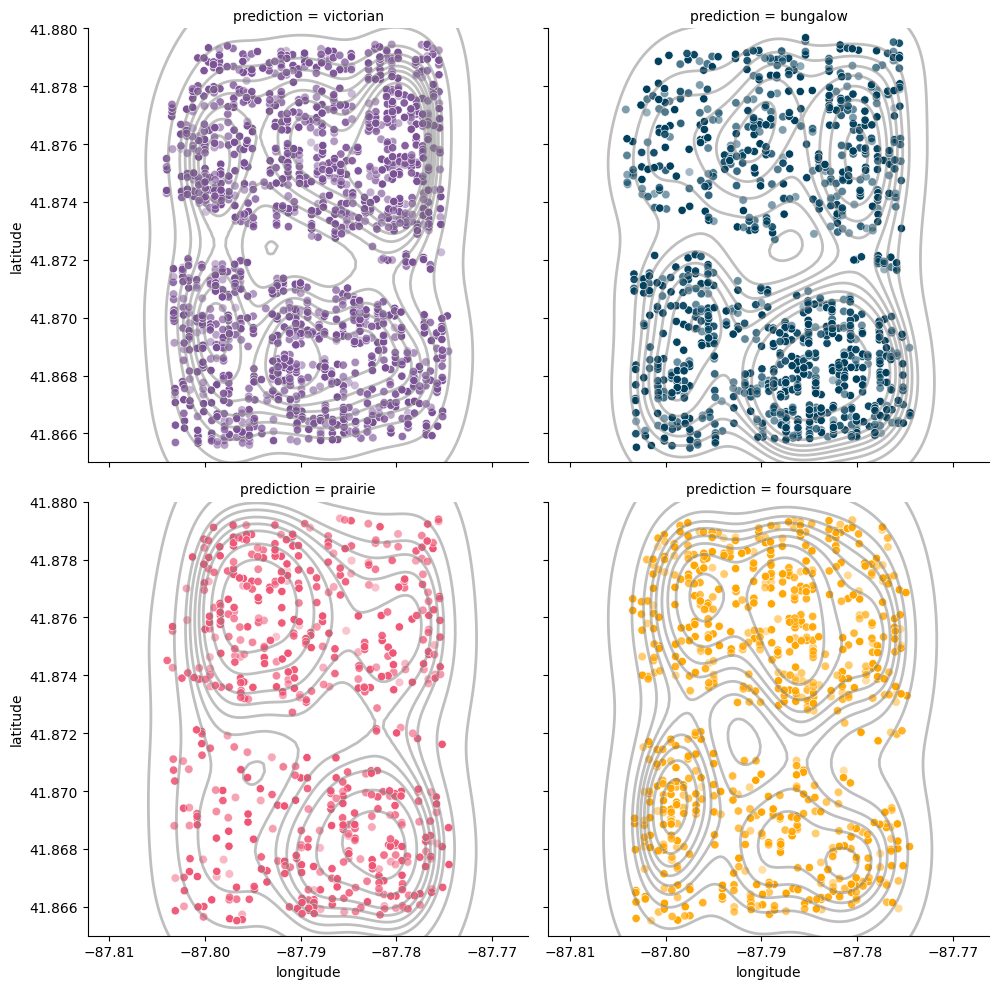

In [84]:
# Plot the distribution of different architectural home styles

g = sns.FacetGrid(df_merged, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.scatterplot, 'longitude', 'latitude', alpha=df_merged['probability'])
g.map(sns.kdeplot, 'longitude', 'latitude', levels=10, color='gray', linewidths=2, alpha=0.5)

g.set(ylim=(41.865, 41.88))


In [85]:
df_merged['home_value'].notna().sum()
# 3146 single-family homes have home values.. cool

3146

In [86]:
# Create dummy variables for logistic regression models
df_merged[['bungalow','foursquare','prairie','victorian']] = pd.get_dummies(df_merged['prediction'])

<Axes: xlabel='latitude', ylabel='foursquare'>

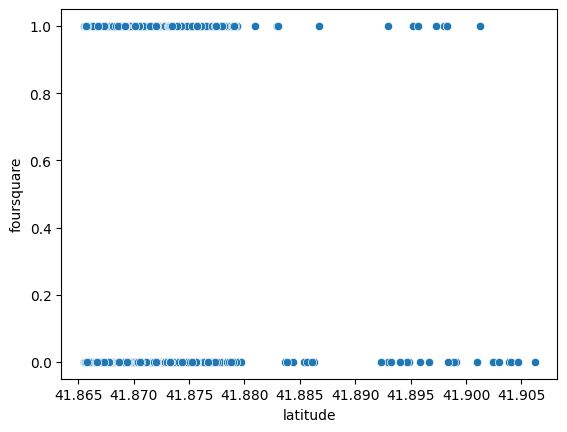

In [87]:
sns.scatterplot(data=df_merged, x='latitude', y='foursquare')
# sns.scatterplot(data=df_merged, x='latitude', y='prairie')
# plt.xscale('log')

In [88]:
from sklearn import linear_model

df_drop = df_merged.dropna(subset=['longitude','latitude','foursquare','home_value'])

y = df_drop['foursquare']
X = df_drop[['latitude']]

logr = linear_model.LogisticRegression(verbose=1)

logr.fit(X,y)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.24579D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      5      8      1     0     0   4.590D-05   5.038D-01
  F =  0.50382443111654129     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


LogisticRegression(verbose=1)

In [43]:
odds = np.exp(logr.coef_)
print(odds)


[[0.97221297]]


In [44]:
# logr.coef_
# dir(logr)
logr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 1,
 'warm_start': False}

n= 3146 features
r= -0.16 p= 0.0


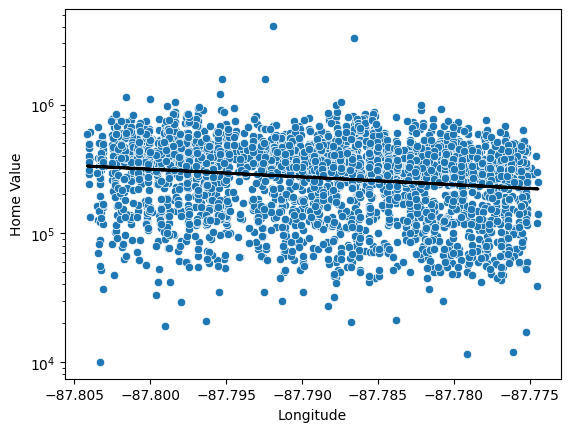

In [221]:
from scipy import stats

sns.scatterplot(data=df_merged, x='longitude', y='home_value')
# sns.scatterplot(data=df_merged, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

df_drop = df_merged.dropna(subset=['longitude','home_value'])

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# r = -0.15, P < 0.001
# there is a negative correlation between longitude and home value
# as we get further from the city (Chicago) center, home values INCREASE

# Residuals plot


# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='black', linewidth=2)
plt.xlabel('Longitude')
plt.ylabel('Home Value')

plt.savefig('reports/figures/home_value_regression.png')

(1890.0, 1940.0)

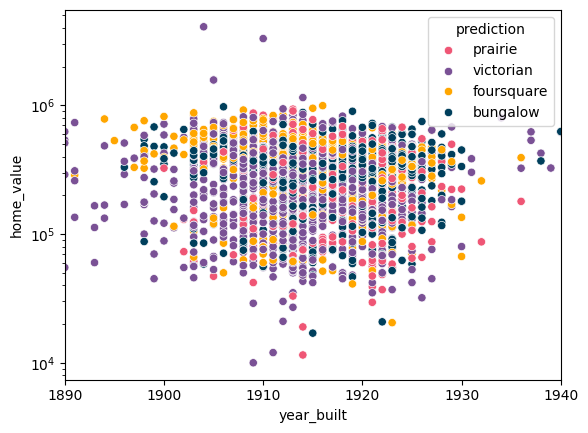

In [401]:
# Plot home value by year built
sns.scatterplot(data=df_merged, x='year_built', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')
plt.xlim(1890, 1940)


In [101]:
# Find home with highest value
df_merged.loc[df_merged['home_value'].idxmax()]
# OK this isn't right. But it is probably a victorian (or maybe foursquare) home


image                                                                737-Wesley-Ave_pid13249690.jpg
prediction                                                                                victorian
probability                                                                                0.982236
pid                                                                                        13249690
input                                                                                737 WESLEY AVE
match                                                                                737 Wesley Ave
property_id                                                                                13249690
latitude                                                                                  41.874797
longitude                                                                                -87.791904
search_url                                          /IL/Oak-Park/737-Wesley-Ave-60304/home/13249690


In [104]:
df_merged['year_built'].min(), df_merged['year_built'].max()
# 2020? let's see about that...

('1816', '2020')

In [108]:
df_merged[df_merged['year_built'] == '2020']
# might be right.
# looks pretty modern

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,image_url,home_value,in_oak_park,home_type,year_built,unique_homes_in_radius,bungalow,foursquare,prairie,victorian
450,1159-Lyman-Ave_pid13250217.jpg,foursquare,0.357998,13250217,1159 LYMAN AVE,1159 Lyman Ave,13250217,41.866815,-87.776979,/IL/Oak-Park/1159-Lyman-Ave-60304/home/13250217,['https://ssl.cdn-redfin.com/photo/68/mbphoto/244/genMid.10651244_3.jpg'],610000.0,1,Single-family,2020,NaN,False,True,False,False


In [219]:
# Convert year to an integer
df_merged['year_built'] = df_merged['year_built'].astype(int)

# Get unique years for animating plot
YEARS = sorted(df_merged['year_built'].unique())
YEARS[0:5]

[1816, 1875, 1883, 1884, 1885]

In [217]:
# Make an animated plot

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(5,3)

ax.axis('off')

map_df.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

def animate(i):
    # ax.clear()
    # Get the point from the points list at index i
    pts = df_merged[df_merged['year_built'] == YEARS[i]]

    # Plot that point using the x and y coordinates
    for pred in prediction_colors.keys():
        subset = pts[pts['prediction'] == pred]
        ax.plot(subset['longitude'], subset['latitude'], color=prediction_colors[pred], label=pred, marker='o', linestyle='None', markersize=2)

    ax.set_title(f'Year: {YEARS[i]}')

    # Set the x and y axis to display a fixed range
    ax.set_xlim(df_merged['longitude'].min(), df_merged['longitude'].max())
    ax.set_ylim(df_merged['latitude'].min(), 41.88)

ani = FuncAnimation(fig, animate, frames=len(YEARS), interval=100, repeat=False)
plt.close()

# Save the animation as an animated GIF
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

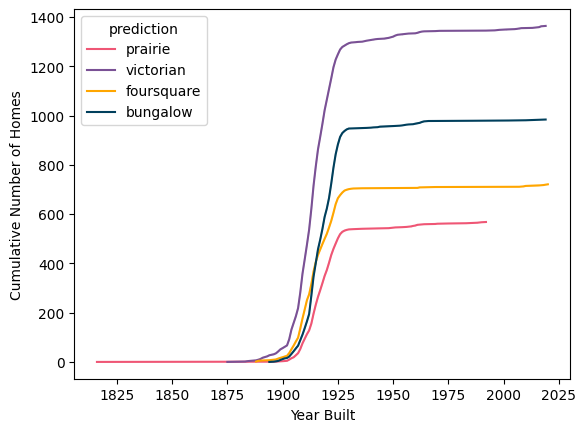

In [218]:
# Sort dataframe by year built
df_merged.sort_values(by='year_built', ascending=True, inplace=True)

# Count the cumulative number of homes grouped by prediction (home style)
df_merged['cumsum_year'] = df_merged.groupby('prediction')['year_built'].cumcount()

sns.lineplot(data=df_merged, x='year_built', y='cumsum_year', hue='prediction', palette=prediction_colors)
plt.xlabel('Year Built')
plt.ylabel('Cumulative Number of Homes')
plt.savefig('reports/figures/cumsum_year.png')

## Multiple regression for home values

In [383]:
df_merged['homes_nnd'] = find_unique(df_merged, radius=0.001, stratify=False)


r= -0.03 p= 0.112


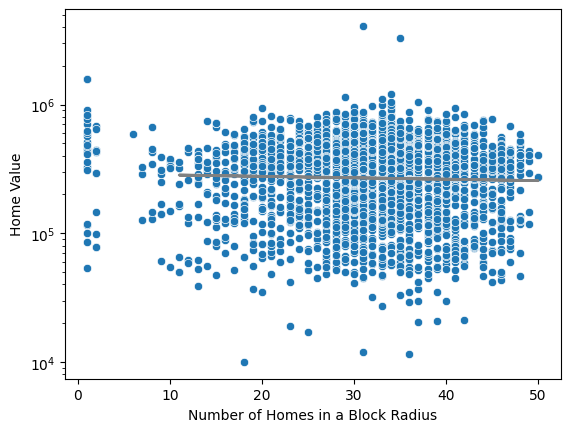

In [397]:
# sns.histplot(data=df_merged, x='homes_nnd', bins=20)
sns.scatterplot(data=df_merged, x='homes_nnd', y='home_value') # 0.001 is about 100 meters
plt.yscale('log')
plt.ylabel('Home Value')
plt.xlabel('Number of Homes in a Block Radius')

df_drop = df_merged.dropna(subset=['homes_nnd','home_value'])
df_drop = df_drop[df_drop['homes_nnd'] > 10]

x = df_drop['homes_nnd']
y = np.log(df_drop['home_value'])
slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r, 2), 'p=', round(p, 3))

# Plot the regression line
plt.plot(x, np.exp(slope * x + intercept), color='gray', linewidth=2)

# No relationship between home density and home value

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:     np.log(home_value)   No. Observations:                 3146
Model:                            GLM   Df Residuals:                     3137
Model Family:                Gaussian   Df Model:                            8
Link Function:               Identity   Scale:                         0.44167
Method:                          IRLS   Log-Likelihood:                -3174.0
Date:                Thu, 10 Oct 2024   Deviance:                       1385.5
Time:                        07:05:59   Pearson chi2:                 1.39e+03
No. Iterations:                     3   Pseudo R-squ. (CS):            0.08847
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                -2146.4176    179.096    -11.985      0.000   -2497.440   -1795.395
prediction[T.foursquare]     0.0398      0.035      1.147      0.251      -0.028       0.108
prediction[T.prairie]       -0.1636      0.037     -4.371      0.000      -0.237      -0.090
prediction[T.victorian]     -0.2957      0.030     -9.815      0.000      -0.355      -0.237
latitude                    20.4309      2.617      7.806      0.000      15.301      25.561
longitude                  -14.8266      1.502     -9.872      0.000     -17.770     -11.883
home_density                 0.0031      0.002      2.035      0.042       0.000       0.006
unique_home_styles          -0.0071      0.017     -0.431      0.667      -0.040       0.025
year_built                   0.0010      0.001      1.142      0.253      -0.001       0.003
============================================================================================
"""

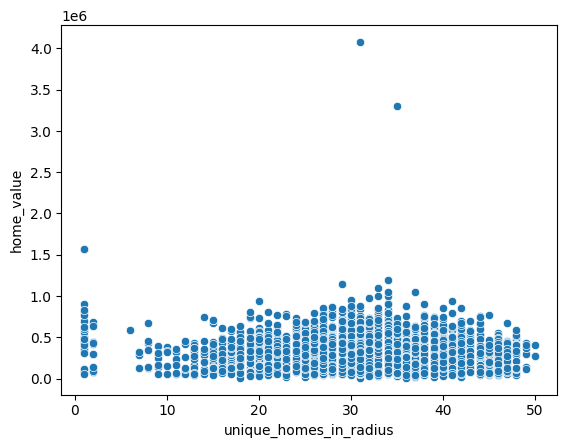

In [406]:
# Look at interaction longitude and architectural style
# Does home value always increase as we move further from the city center?

import statsmodels.api as sm
import statsmodels.formula.api as smf

# Add unique homes in radius column
df_merged['home_density'] = find_unique(df_merged, radius=0.001, stratify=False)  # .001 is about 100 meters (1 block)
df_merged['unique_home_styles'] = find_unique(df_merged, radius=0.0002, stratify=True)  # .0002 is about 20 meters

sns.scatterplot(data=df_merged, x='unique_homes_in_radius', y='home_value')

df_drop = df_merged.dropna(subset=['longitude','latitude','home_value'])

# Fit a generalized linear model
# model = smf.glm('np.log(home_value) ~ (latitude + longitude) + prediction', data=df_drop, family=sm.families.Gaussian())
model = smf.glm('np.log(home_value) ~ latitude + longitude + prediction + home_density + unique_home_styles + year_built', data=df_drop, family=sm.families.Gaussian())
fit = model.fit()

# We can see that none of the interactions are significant, so just latitude and longitude are important
fit.summary()


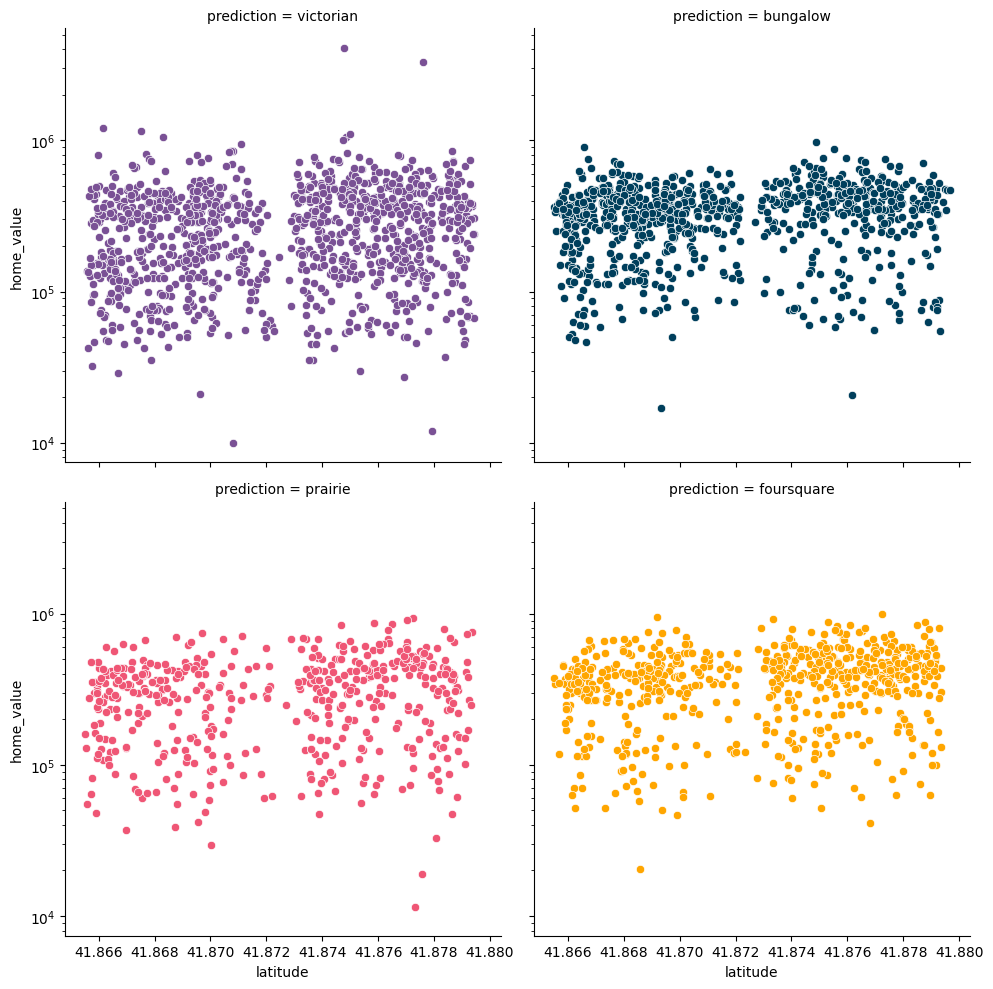

In [110]:
# Plotting the regression results
df_filter = df_drop[df_drop['latitude'] < 41.88]
g = sns.FacetGrid(df_filter, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)
g.map(sns.scatterplot, 'latitude', 'home_value')
plt.yscale('log')

n= 897 features
r= -0.25 p= 0.0


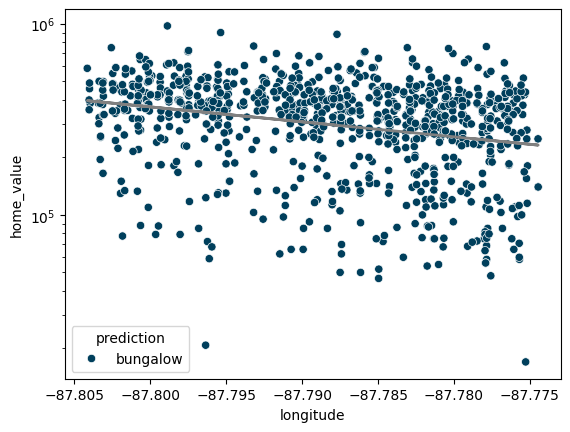

In [337]:
# Bungalows

from scipy import stats

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'bungalow']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


n= 799 features
r= -0.13 p= 0.0


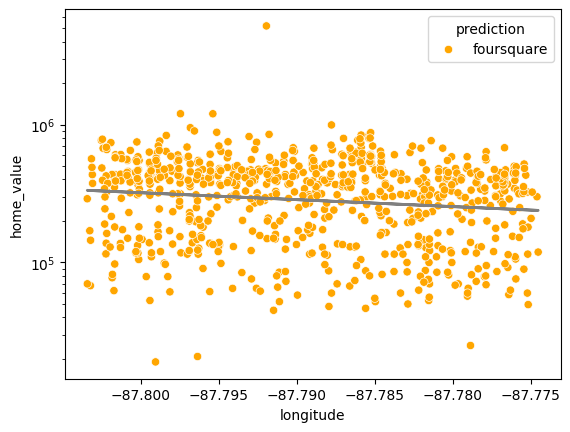

In [49]:
# American foursquares

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'foursquare']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


n= 476 features
r= -0.08 p= 0.079


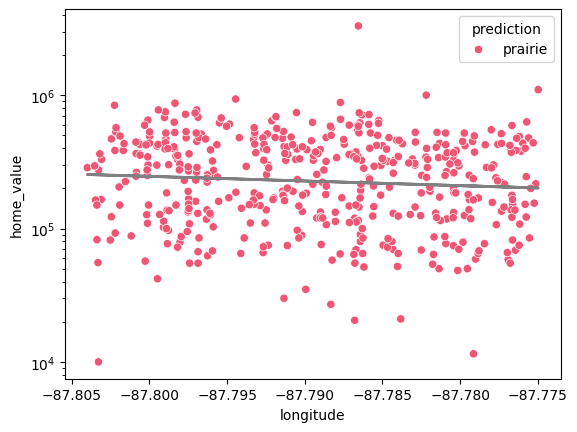

In [56]:
# Prairie style homes

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'prairie']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)
